# Statistical Analysis Paper

Load the source-stratified SA results into pandas DataFrames for analysis.


In [1]:
#!pip install stargazer

In [2]:
import matplotlib.pyplot as plt
import colormaps

plt.style.use("opinionated_rc")


## Load SA results datasets


In [3]:
from pathlib import Path

import numpy as np
import pandas as pd

sa_results_dir = Path("results/SA_approach_run_v4")
figures_dir = Path("Figures")
figures_dir.mkdir(exist_ok=True)

target = "share_of_correct_agents_at_convergence"
target_stat_order = ["density", "degree_gini", "clustering"]
target_predictor_map = {
    "density": "sa_achieved_density",
    "degree_gini": "sa_achieved_degree_gini",
    "clustering": "sa_achieved_clustering",
}

predictor_order = [
    "n_experiments",
    "uncertainty",
    "sa_achieved_density",
    "sa_achieved_degree_gini",
    "sa_achieved_clustering",
]
base_predictors = predictor_order.copy()

label_map = {
    "Intercept": "Intercept",
    "n_experiments": "Number of Experiments",
    "uncertainty": "Problem Easiness",
    "sa_achieved_density": "Achieved Density",
    "sa_achieved_degree_gini": "Achieved Degree Gini",
    "sa_achieved_clustering": "Achieved Clustering",
    "share_of_correct_agents_at_convergence": "Share Correct Agents",
}


def format_p(p_value):
    if pd.isna(p_value):
        return "= NA"
    if p_value < 0.001:
        return "< .001"
    return f"= {p_value:.3f}".replace("0.", ".")


def safe_filename(value):
    return "".join(ch if ch.isalnum() or ch in "-_." else "_" for ch in str(value))


def _target_sort_key(target_stat):
    try:
        return target_stat_order.index(str(target_stat))
    except ValueError:
        return len(target_stat_order)


def _numeric_or_nan(df, column):
    if column not in df.columns:
        return pd.Series(np.nan, index=df.index, dtype=float)
    return pd.to_numeric(df[column], errors="coerce")


def prepare_sa_results(df, path):
    out = df.copy()

    if "sa_source_id" in out.columns:
        source = out["sa_source_id"]
    elif "source_id" in out.columns:
        source = out["source_id"]
    else:
        source = pd.Series(path.stem, index=out.index)

    out["analysis_source_id"] = source.fillna(path.stem).astype(str)
    out["analysis_source_file"] = path.name
    out["sa_target_stat"] = out["sa_target_stat"].astype(str)
    out[target] = _numeric_or_nan(out, target)

    out["sa_edit_distance"] = _numeric_or_nan(out, "sa_edit_distance")
    m0 = _numeric_or_nan(out, "sa_m0").replace(0, np.nan)
    out["sa_edit_distance_fraction"] = out["sa_edit_distance"] / m0

    for column in base_predictors:
        out[column] = _numeric_or_nan(out, column)

    return out


NEAR_CONSTANT_ABS_TOL = 1e-12
NEAR_CONSTANT_REL_TOL = 1e-10
MIN_MODEL_UNIQUE_VALUES = 2

predictor_screening_diagnostics = {}
dropped_predictors_by_model = {}


def _finite_numeric_frame(df, columns):
    out = df[list(columns)].apply(pd.to_numeric, errors="coerce")
    return out.replace([np.inf, -np.inf], np.nan)


def _variation_diagnostic_row(data, column):
    values = data[column].dropna()
    n_complete = int(values.shape[0])
    n_unique = int(values.nunique(dropna=True))

    if n_complete == 0:
        value_min = value_max = value_mean = value_sd = value_range = np.nan
    else:
        value_min = float(values.min())
        value_max = float(values.max())
        value_mean = float(values.mean())
        value_sd = float(values.std(ddof=1)) if n_complete > 1 else 0.0
        value_range = float(value_max - value_min)

    scale_candidates = [1.0]
    for value in [value_min, value_max, value_mean]:
        if pd.notna(value):
            scale_candidates.append(abs(float(value)))
    scale = max(scale_candidates)
    tolerance = max(NEAR_CONSTANT_ABS_TOL, NEAR_CONSTANT_REL_TOL * scale)

    if n_complete == 0:
        drop_reason = "no finite complete-case values"
    elif n_unique < MIN_MODEL_UNIQUE_VALUES:
        drop_reason = f"fewer than {MIN_MODEL_UNIQUE_VALUES} unique complete-case values"
    elif pd.notna(value_range) and value_range <= tolerance:
        drop_reason = f"range <= tolerance ({value_range:.3g} <= {tolerance:.3g})"
    elif pd.notna(value_sd) and value_sd <= tolerance:
        drop_reason = f"sd <= tolerance ({value_sd:.3g} <= {tolerance:.3g})"
    else:
        drop_reason = ""

    return {
        "predictor": column,
        "n_complete": n_complete,
        "n_unique": n_unique,
        "min": value_min,
        "max": value_max,
        "range": value_range,
        "mean": value_mean,
        "sd": value_sd,
        "scale": scale,
        "near_constant_tolerance": tolerance,
        "dropped": bool(drop_reason),
        "drop_reason": drop_reason,
    }


def model_predictors(df, predictors, *, outcome=target, dataset_name=None):
    missing = [column for column in predictors if column not in df.columns]
    if outcome not in df.columns:
        missing.append(outcome)
    if missing:
        raise KeyError(f"Missing required model columns: {missing}")

    model_columns = [outcome, *predictors]
    complete_data = _finite_numeric_frame(df, model_columns).dropna(subset=model_columns)

    diagnostics = pd.DataFrame(
        [_variation_diagnostic_row(complete_data, column) for column in predictors]
    )
    kept = diagnostics.loc[~diagnostics["dropped"], "predictor"].tolist()
    dropped = diagnostics.loc[diagnostics["dropped"], "predictor"].tolist()

    if dataset_name is not None:
        diagnostics = diagnostics.assign(
            dataset=dataset_name,
            n_complete_model_rows=len(complete_data),
        )
        predictor_screening_diagnostics[dataset_name] = diagnostics
        dropped_predictors_by_model[dataset_name] = dropped

    return kept


csv_paths = sorted(sa_results_dir.glob("*.csv"))
if not csv_paths:
    raise FileNotFoundError(f"No SA result CSVs found in {sa_results_dir.resolve()}")

source_files = {}
frames = []
for path in csv_paths:
    prepared = prepare_sa_results(pd.read_csv(path), path)
    source_files[path.name] = prepared
    frames.append(prepared)

combined_results_df = pd.concat(frames, ignore_index=True)

source_groups = (
    combined_results_df.groupby("analysis_source_id", dropna=False)
    .agg(
        n_rows=(target, "size"),
        n_complete_outcomes=(target, "count"),
        mean_share_correct=(target, "mean"),
        min_share_correct=(target, "min"),
        max_share_correct=(target, "max"),
    )
    .reset_index()
)

analysis_groups = (
    combined_results_df.groupby(["analysis_source_id", "sa_target_stat"], dropna=False)
    .agg(
        n_rows=(target, "size"),
        n_complete_outcomes=(target, "count"),
        mean_share_correct=(target, "mean"),
        min_share_correct=(target, "min"),
        max_share_correct=(target, "max"),
    )
    .reset_index()
)

source_result_datasets = {}
source_methods_columns = {}
for source_id, group in sorted(
    combined_results_df.groupby("analysis_source_id", dropna=False),
    key=lambda item: str(item[0]),
):
    name = str(source_id)
    source_result_datasets[name] = group.copy()
    source_methods_columns[name] = model_predictors(group, base_predictors, dataset_name=name)

result_datasets = {}
methods_columns = {}
dataset_meta = {}
for (source_id, target_stat), group in sorted(
    combined_results_df.groupby(["analysis_source_id", "sa_target_stat"], dropna=False),
    key=lambda item: (str(item[0][0]), _target_sort_key(item[0][1]), str(item[0][1])),
):
    source_id = str(source_id)
    target_stat = str(target_stat)
    name = f"{source_id} | {target_stat}"
    result_datasets[name] = group.copy()
    methods_columns[name] = model_predictors(group, base_predictors, dataset_name=name)
    dataset_meta[name] = {"source_id": source_id, "sa_target_stat": target_stat}

print(f"Loaded {len(csv_paths)} SA result file(s) from {sa_results_dir}")
print(f"Loaded {len(combined_results_df):,} rows across {len(source_result_datasets)} source-network dataset(s)")
display(source_groups)
print("SA target-stat composition:")
display(analysis_groups)

predictor_screening_df = pd.concat(
    predictor_screening_diagnostics.values(),
    ignore_index=True,
)
analysis_predictor_screening_df = predictor_screening_df.loc[
    predictor_screening_df["dataset"].str.contains(" | ", regex=False)
].copy()

print("Predictor variation screening for source/target-stat models:")
display(
    analysis_predictor_screening_df[[
        "dataset",
        "predictor",
        "n_complete_model_rows",
        "n_unique",
        "min",
        "max",
        "range",
        "sd",
        "near_constant_tolerance",
        "dropped",
        "drop_reason",
    ]]
)

dropped_predictor_screening_df = analysis_predictor_screening_df.loc[
    analysis_predictor_screening_df["dropped"]
].copy()
if dropped_predictor_screening_df.empty:
    print("No near-constant predictors were dropped.")
else:
    print("Dropped near-constant predictors:")
    display(
        dropped_predictor_screening_df[[
            "dataset",
            "predictor",
            "n_complete_model_rows",
            "n_unique",
            "range",
            "sd",
            "near_constant_tolerance",
            "drop_reason",
        ]]
    )

print("OLS predictors retained by source/target-stat model:")
for name, predictors in methods_columns.items():
    dropped = dropped_predictors_by_model.get(name, [])
    dropped_text = f"; dropped: {dropped}" if dropped else ""
    print(f"- {name}: {predictors}{dropped_text}")


Loaded 3 SA result file(s) from results/SA_approach_run_v4
Loaded 30,000 rows across 3 source-network dataset(s)


,analysis_source_id,n_rows,n_complete_outcomes,mean_share_correct,min_share_correct,max_share_correct
0,ego_network,10000,10000,0.970504,0.003976,1.000000
1,pud_network,10000,10000,0.737732,0.166667,0.977778
2,tobacco_network,10000,10000,0.861868,0.141869,1.000000


SA target-stat composition:


,analysis_source_id,sa_target_stat,n_rows,n_complete_outcomes,mean_share_correct,min_share_correct,max_share_correct
0,ego_network,clustering,2667,2667,0.973519,0.015905,1.000000
1,ego_network,degree_gini,3222,3222,0.970584,0.007952,1.000000
2,ego_network,density,4111,4111,0.968486,0.003976,1.000000
3,pud_network,clustering,3960,3960,0.729071,0.177778,0.966667
4,pud_network,degree_gini,3236,3236,0.734573,0.166667,0.966667
5,pud_network,density,2804,2804,0.753610,0.233333,0.977778
6,tobacco_network,clustering,3469,3469,0.855506,0.318339,0.948097
7,tobacco_network,degree_gini,3084,3084,0.862987,0.141869,0.944637
8,tobacco_network,density,3447,3447,0.867268,0.266436,1.000000


Predictor variation screening for source/target-stat models:


,dataset,predictor,n_complete_model_rows,n_unique,min,max,range,sd,near_constant_tolerance,dropped,drop_reason
15,ego_network | density,n_experiments,4111,3320,1002.000000,9999.000000,8997.000000,2.631574e+03,9.999000e-07,False,
16,ego_network | density,uncertainty,4111,4111,0.000002,0.001000,0.000998,2.897160e-04,1.000000e-10,False,
17,ego_network | density,sa_achieved_density,4111,100,0.003548,0.019683,0.016134,4.720109e-03,1.000000e-10,False,
18,ego_network | density,sa_achieved_degree_gini,4111,100,0.920102,0.920703,0.000602,7.533487e-05,1.000000e-10,False,
19,ego_network | density,sa_achieved_clustering,4111,100,0.421432,0.422604,0.001172,1.668258e-04,1.000000e-10,False,
20,ego_network | degree_gini,n_experiments,3222,2673,1000.000000,9999.000000,8999.000000,2.612506e+03,9.999000e-07,False,
21,ego_network | degree_gini,uncertainty,3222,3222,0.000002,0.000999,0.000997,2.866774e-04,1.000000e-10,False,
22,ego_network | degree_gini,sa_achieved_density,3222,1,0.011616,0.011616,0.000000,5.204978e-18,1.000000e-10,True,fewer than 2 unique complete-case values
23,ego_network | degree_gini,sa_achieved_degree_gini,3222,81,0.841360,0.968816,0.127456,3.675577e-02,1.000000e-10,False,
24,ego_network | degree_gini,sa_achieved_clustering,3222,80,0.421115,0.422264,0.001149,1.065595e-04,1.000000e-10,False,


Dropped near-constant predictors:


,dataset,predictor,n_complete_model_rows,n_unique,range,sd,near_constant_tolerance,drop_reason
22,ego_network | degree_gini,sa_achieved_density,3222,1,0.0,5.204978e-18,1.000000e-10,fewer than 2 unique complete-case values
27,ego_network | clustering,sa_achieved_density,2667,1,0.0,1.735049e-18,1.000000e-10,fewer than 2 unique complete-case values
28,ego_network | clustering,sa_achieved_degree_gini,2667,1,0.0,0.000000e+00,1.000000e-10,fewer than 2 unique complete-case values
37,pud_network | degree_gini,sa_achieved_density,3236,1,0.0,0.000000e+00,1.000000e-10,fewer than 2 unique complete-case values
42,pud_network | clustering,sa_achieved_density,3960,1,0.0,0.000000e+00,1.000000e-10,fewer than 2 unique complete-case values
43,pud_network | clustering,sa_achieved_degree_gini,3960,1,0.0,0.000000e+00,1.000000e-10,fewer than 2 unique complete-case values
52,tobacco_network | degree_gini,sa_achieved_density,3084,1,0.0,5.205014e-18,1.000000e-10,fewer than 2 unique complete-case values
57,tobacco_network | clustering,sa_achieved_density,3469,1,0.0,1.734974e-18,1.000000e-10,fewer than 2 unique complete-case values
58,tobacco_network | clustering,sa_achieved_degree_gini,3469,1,0.0,0.000000e+00,1.000000e-10,fewer than 2 unique complete-case values


OLS predictors retained by source/target-stat model:
- ego_network | density: ['n_experiments', 'uncertainty', 'sa_achieved_density', 'sa_achieved_degree_gini', 'sa_achieved_clustering']
- ego_network | degree_gini: ['n_experiments', 'uncertainty', 'sa_achieved_degree_gini', 'sa_achieved_clustering']; dropped: ['sa_achieved_density']
- ego_network | clustering: ['n_experiments', 'uncertainty', 'sa_achieved_clustering']; dropped: ['sa_achieved_density', 'sa_achieved_degree_gini']
- pud_network | density: ['n_experiments', 'uncertainty', 'sa_achieved_density', 'sa_achieved_degree_gini', 'sa_achieved_clustering']
- pud_network | degree_gini: ['n_experiments', 'uncertainty', 'sa_achieved_degree_gini', 'sa_achieved_clustering']; dropped: ['sa_achieved_density']
- pud_network | clustering: ['n_experiments', 'uncertainty', 'sa_achieved_clustering']; dropped: ['sa_achieved_density', 'sa_achieved_degree_gini']
- tobacco_network | density: ['n_experiments', 'uncertainty', 'sa_achieved_density', 

## Regression models

Run a separate regression for each source network and SA target statistic. This keeps the intervention regimes separate while using the direct achieved SA values as predictors.


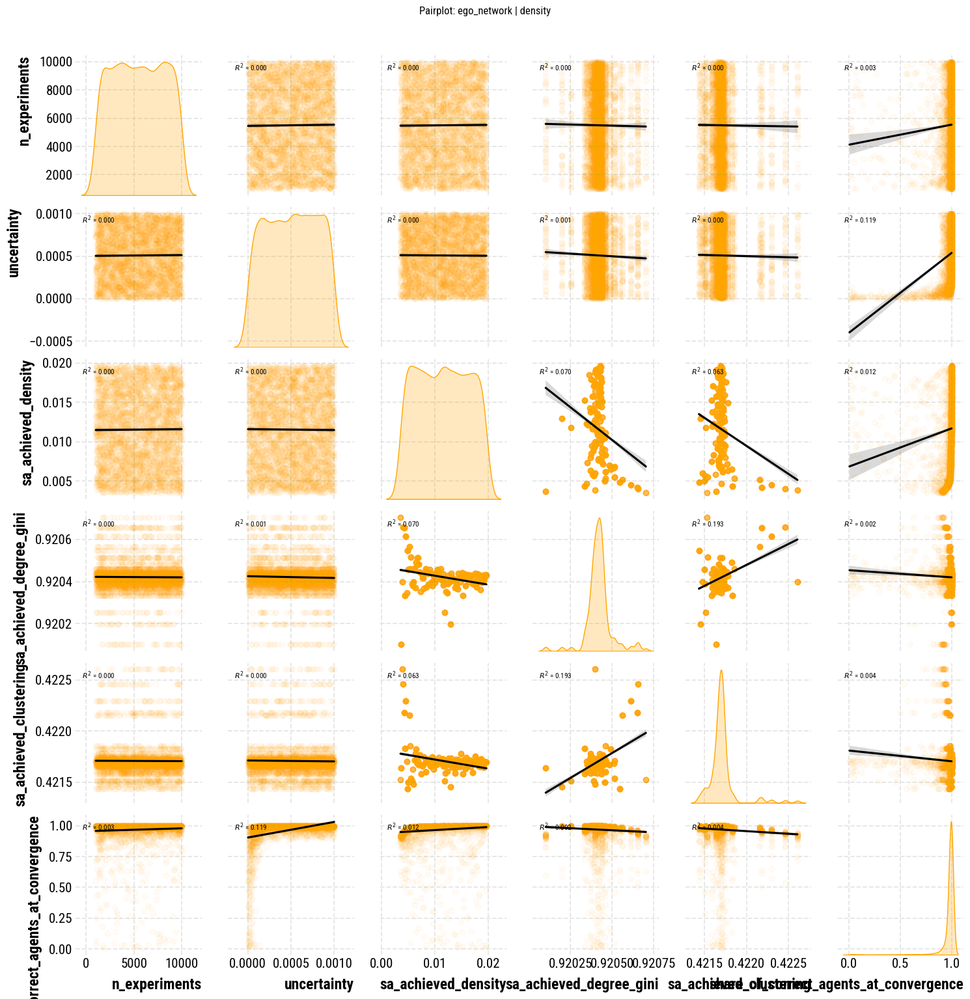

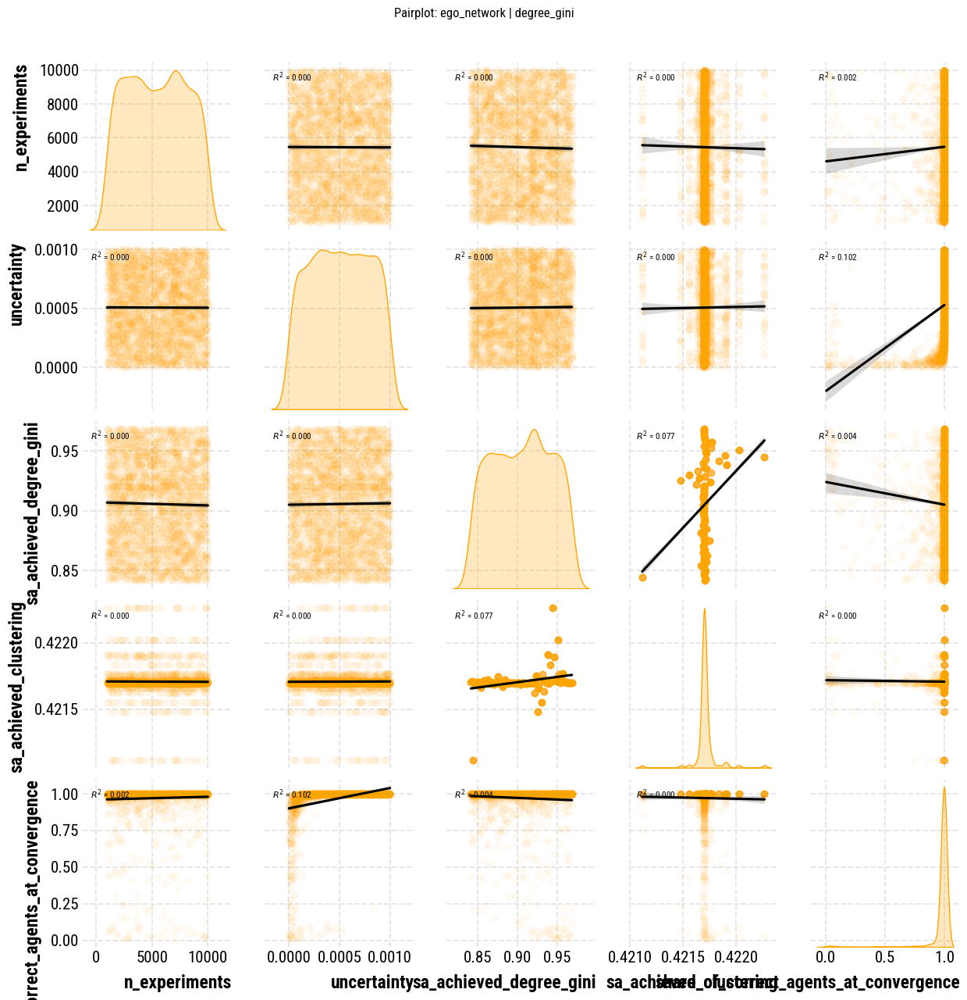

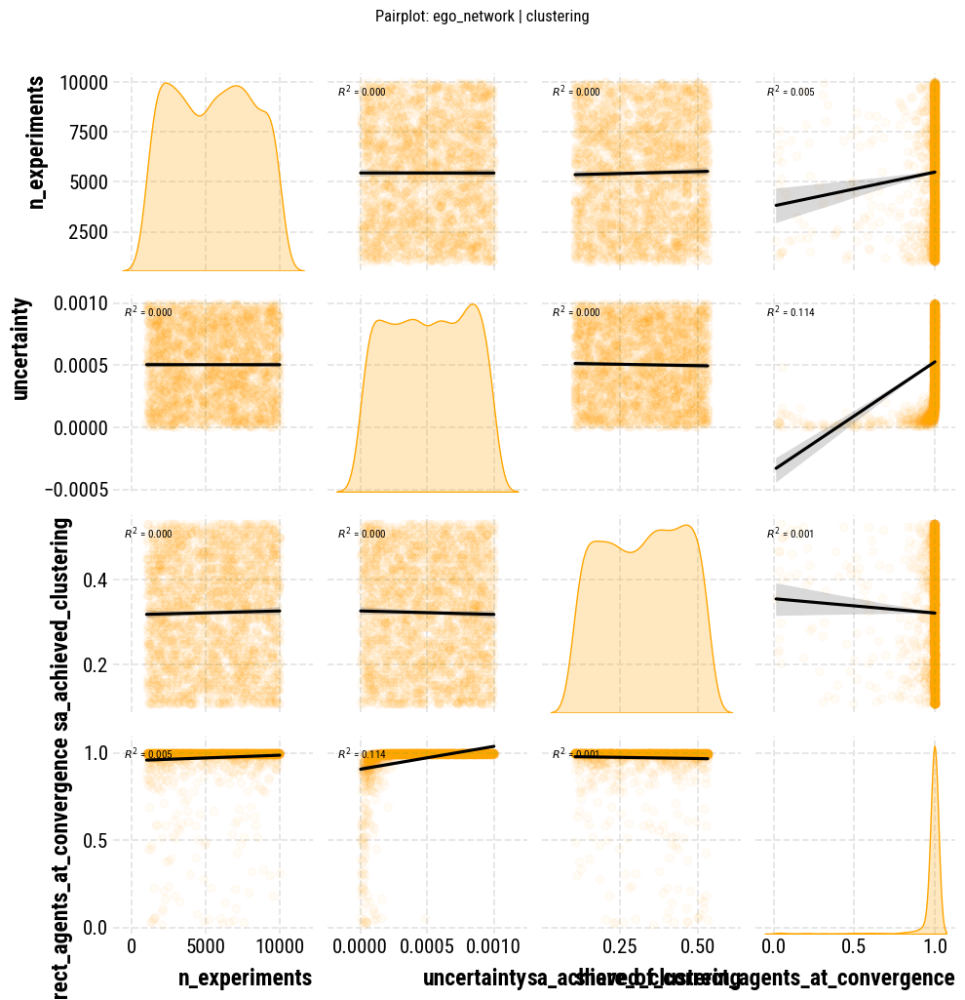

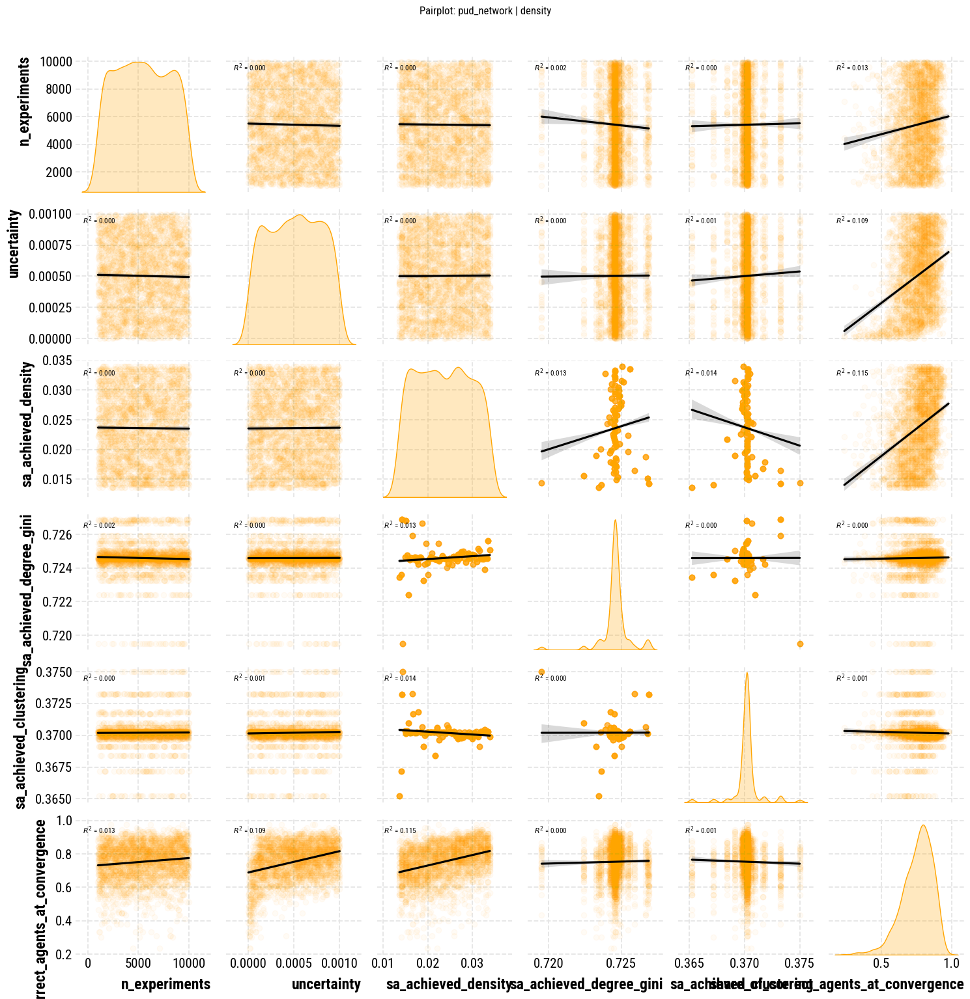

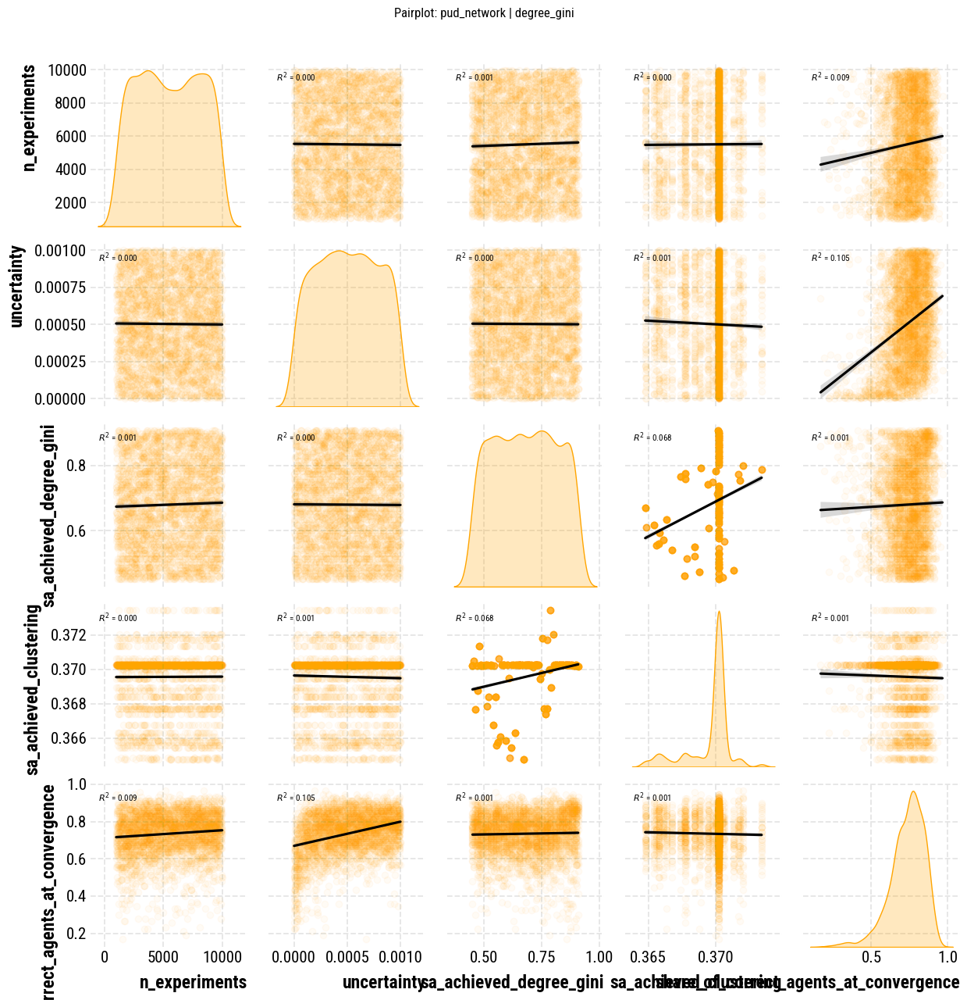

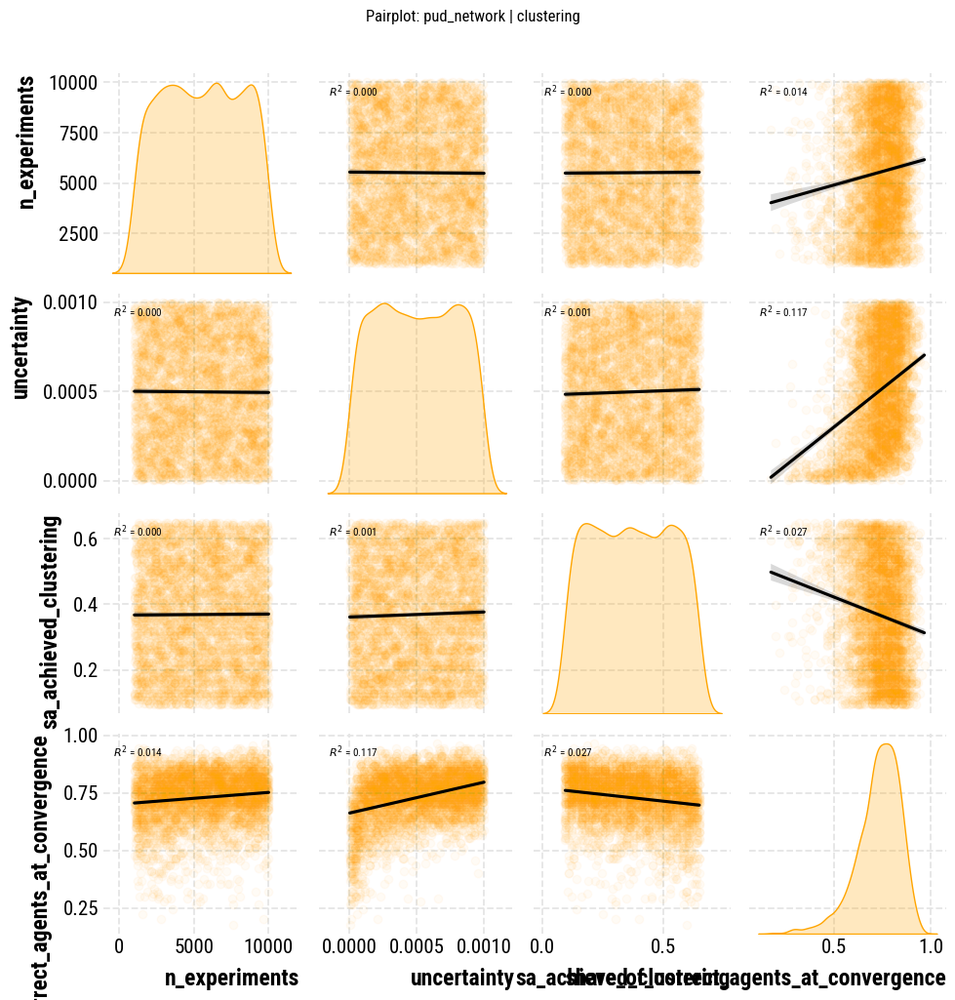

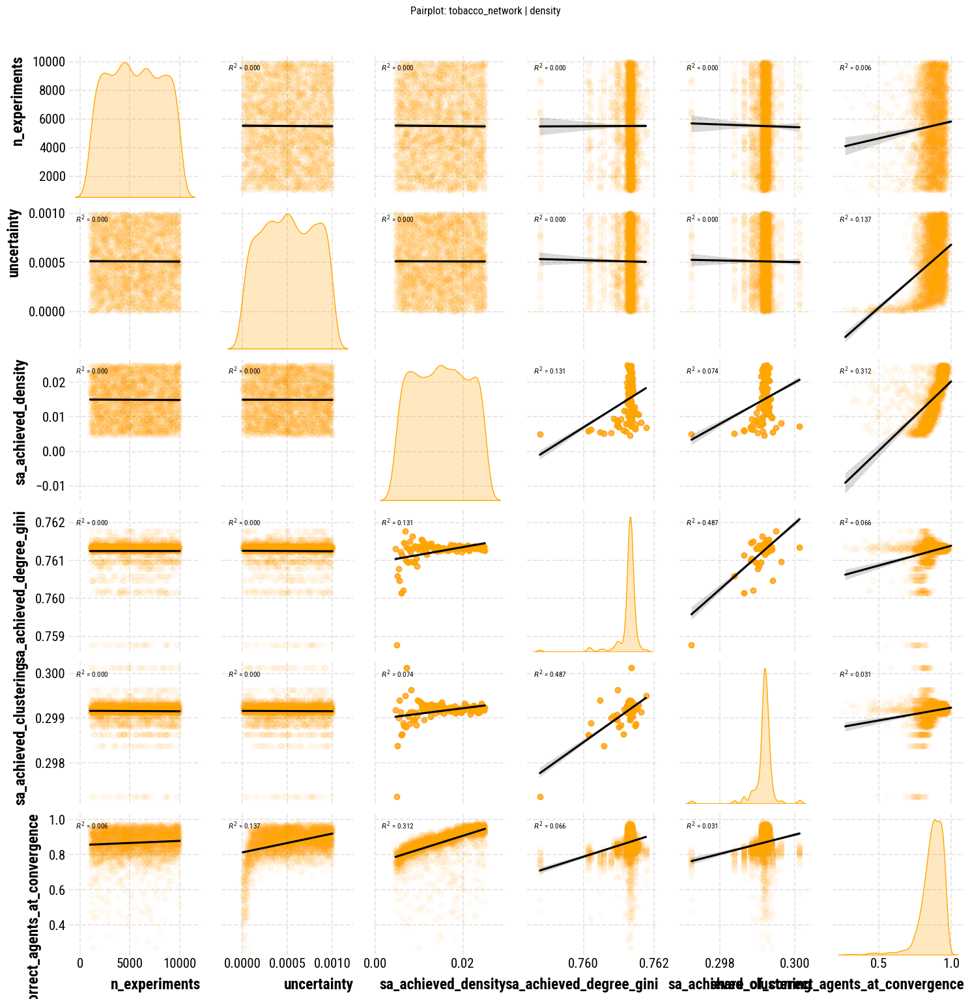

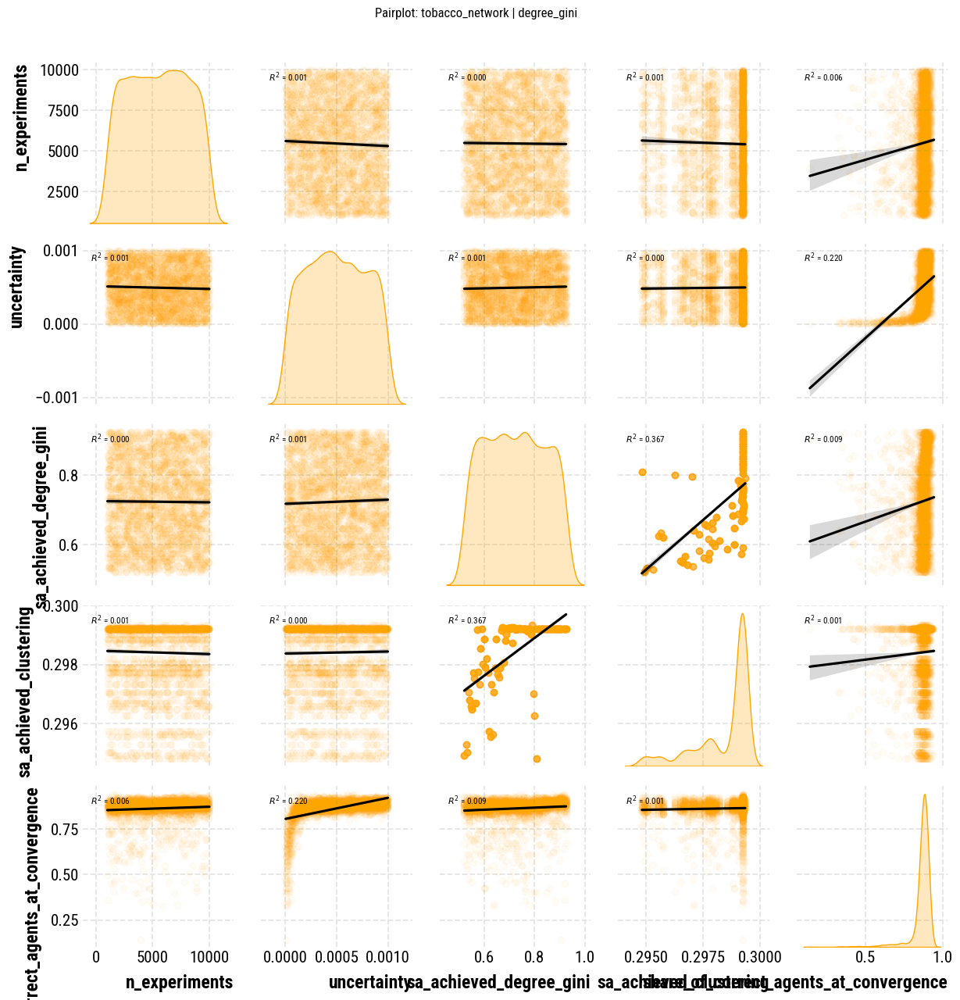

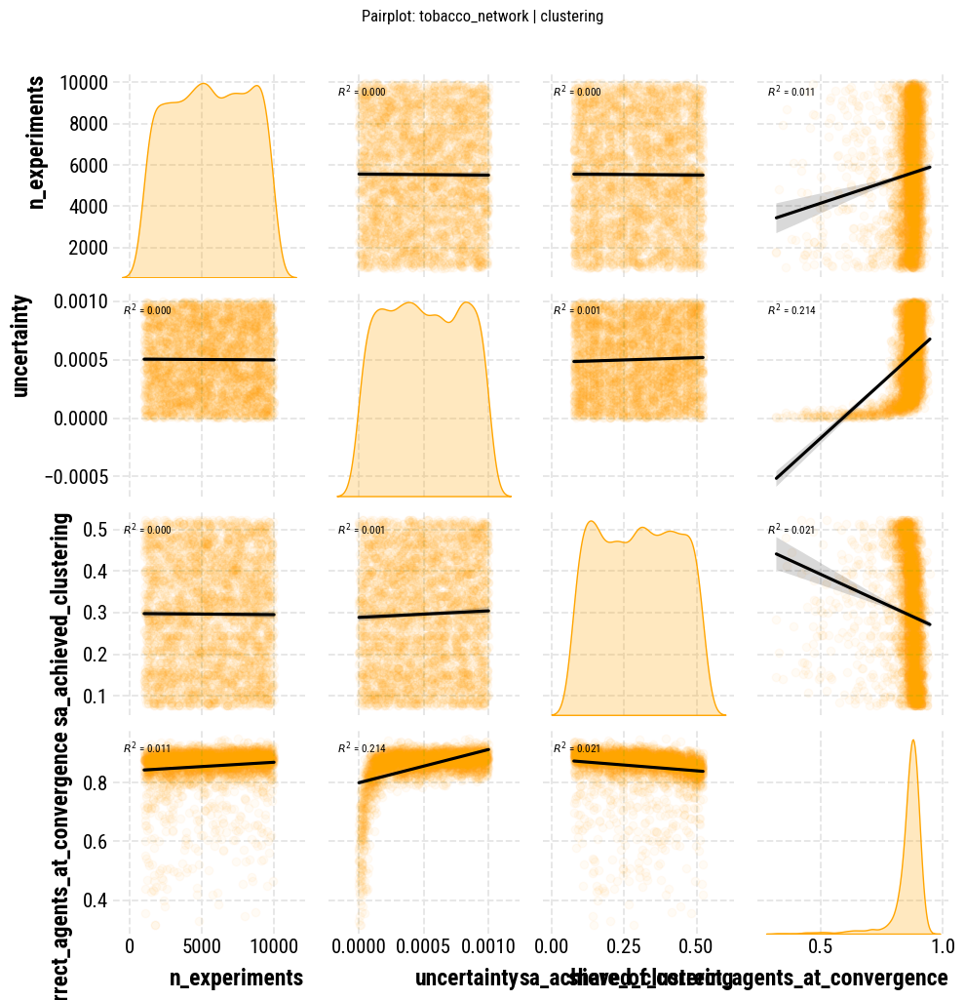

In [4]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats as scipy_stats

for name, df in result_datasets.items():
    predictors = methods_columns[name]
    cols = predictors + [target]
    plot_df = df[cols].dropna()
    if len(predictors) < 1 or len(plot_df) < 3:
        print(f"Skipping pairplot for {name}: not enough complete rows or varying predictors")
        continue

    g = sns.pairplot(
        plot_df,
        diag_kind="kde",
        plot_kws={"color": "orange", "scatter_kws": {"alpha": 0.04}, "line_kws": {"color": "black"}, "ci": 95},
        diag_kws={"color": "orange"},
        kind="reg",
    )

    # Add R² values to each scatter plot when both variables vary.
    for i, y_var in enumerate(cols):
        for j, x_var in enumerate(cols):
            if i != j:
                ax = g.axes[i, j]
                x = plot_df[x_var]
                y = plot_df[y_var]
                if x.nunique(dropna=True) > 1 and y.nunique(dropna=True) > 1:
                    _, _, r_value, _, _ = scipy_stats.linregress(x, y)
                    ax.annotate(f'$R^2$ = {r_value**2:.3f}', xy=(0.05, 0.95),
                                xycoords='axes fraction', fontsize=8,
                                verticalalignment='top')

    g.figure.suptitle(f"Pairplot: {name}", y=1.02)
    plt.tight_layout()
    plt.show()


# Check for multicolinearity


In [5]:
import pandas as pd
import numpy as np
from statsmodels.stats.outliers_influence import variance_inflation_factor

print("=== Multicollinearity Check (VIF) ===\n")

for name, df in result_datasets.items():
    predictors = methods_columns[name]
    data = df[predictors].apply(pd.to_numeric, errors="coerce").dropna()

    print(f"--- {name} ---")
    dropped_here = dropped_predictors_by_model.get(name, [])
    if dropped_here:
        print("Dropped before OLS/VIF by near-constant screening:", dropped_here)
    if len(predictors) < 2 or len(data) < 3:
        print("Skipping VIF: need at least two predictors and three complete rows\n")
        continue

    varying_predictors = [p for p in predictors if data[p].nunique(dropna=True) > 1]
    constant_predictors = [p for p in predictors if p not in varying_predictors]
    if constant_predictors:
        print("Included in OLS but omitted from VIF because constant in this subset:", constant_predictors)

    if len(varying_predictors) < 2:
        print("Skipping VIF: fewer than two predictors vary in this subset\n")
        continue

    data_vif = data[varying_predictors]
    data_std = (data_vif - data_vif.mean()) / data_vif.std(ddof=1)
    data_std = data_std.replace([np.inf, -np.inf], np.nan).dropna()
    if len(data_std) < 3:
        print("Skipping VIF: standardized data has too few complete rows\n")
        continue

    vif_data = pd.DataFrame()
    vif_data["Predictor"] = varying_predictors
    vif_data["VIF"] = [variance_inflation_factor(data_std.values, i) for i in range(len(varying_predictors))]

    print(vif_data.to_string(index=False))
    print("\nNote: VIF > 5 suggests moderate multicollinearity, VIF > 10 suggests high multicollinearity\n")

    print("Correlation matrix:")
    corr_matrix = data_std.corr()
    print(corr_matrix.round(3))
    print("\n")


=== Multicollinearity Check (VIF) ===

--- ego_network | density ---
              Predictor      VIF
          n_experiments 1.000177
            uncertainty 1.001349
    sa_achieved_density 1.102593
sa_achieved_degree_gini 1.280614
 sa_achieved_clustering 1.270142

Note: VIF > 5 suggests moderate multicollinearity, VIF > 10 suggests high multicollinearity

Correlation matrix:
                         n_experiments  uncertainty  sa_achieved_density  \
n_experiments                    1.000        0.009                0.006   
uncertainty                      0.009        1.000               -0.007   
sa_achieved_density              0.006       -0.007                1.000   
sa_achieved_degree_gini         -0.009       -0.032               -0.265   
sa_achieved_clustering          -0.006       -0.015               -0.252   

                         sa_achieved_degree_gini  sa_achieved_clustering  
n_experiments                             -0.009                  -0.006  
uncertainty 

# Fit OLS


=== ego_network | clustering (unstandardized fit) ===
                                      OLS Regression Results                                      
Dep. Variable:     share_of_correct_agents_at_convergence   R-squared:                       0.120
Model:                                                OLS   Adj. R-squared:                  0.119
Method:                                     Least Squares   F-statistic:                     121.1
Date:                                    Sat, 02 May 2026   Prob (F-statistic):           1.58e-73
Time:                                            15:00:08   Log-Likelihood:                 2211.7
No. Observations:                                    2667   AIC:                            -4415.
Df Residuals:                                        2663   BIC:                            -4392.
Df Model:                                               3                                         
Covariance Type:                                nonrobu

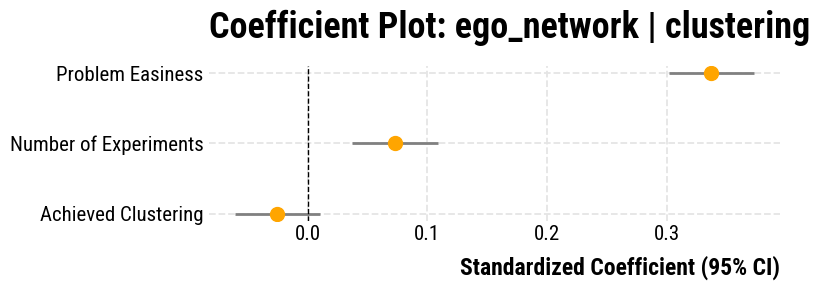

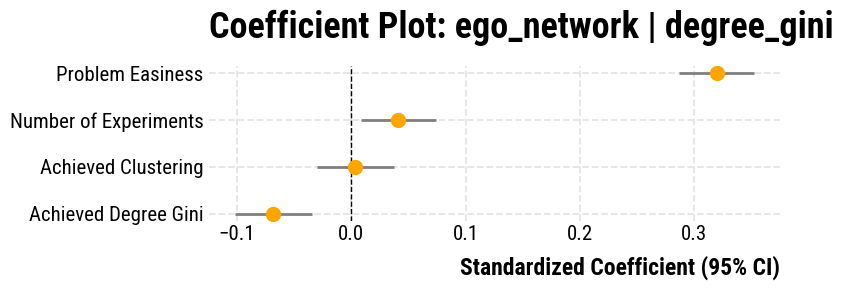

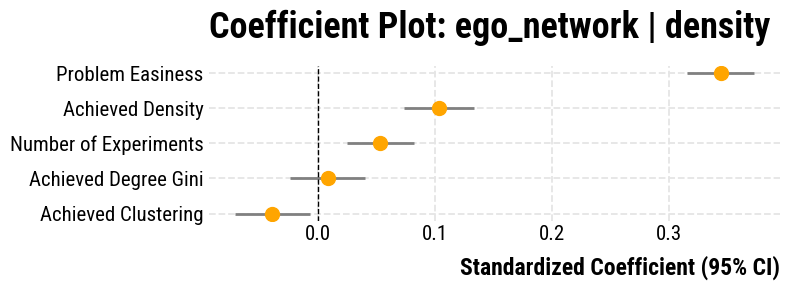

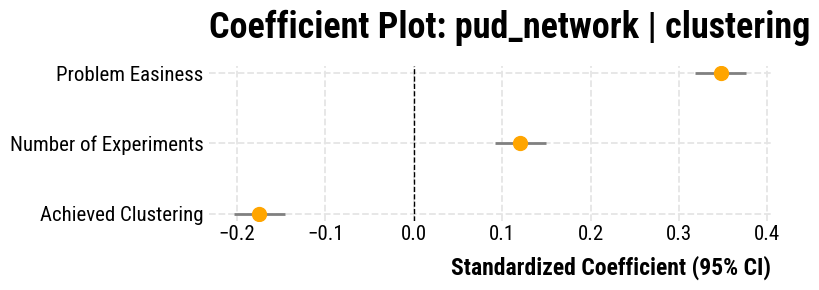

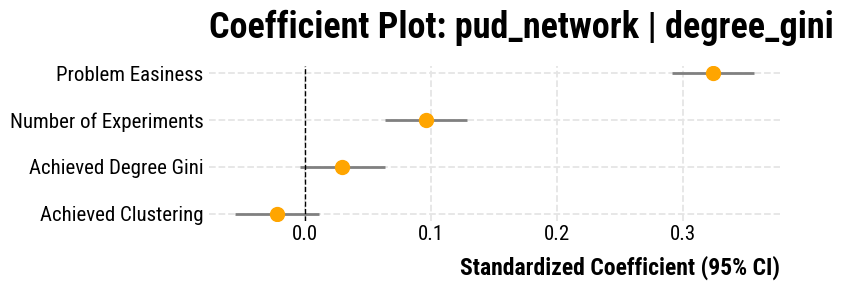

...

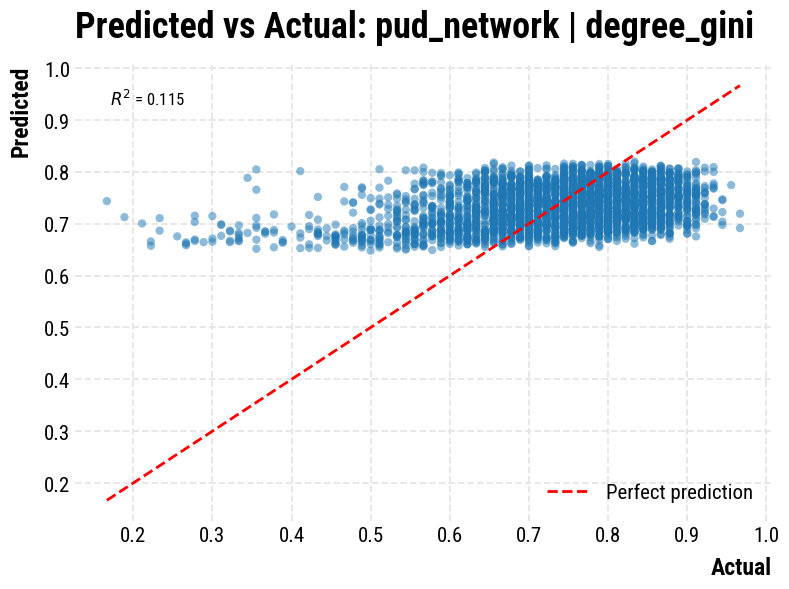

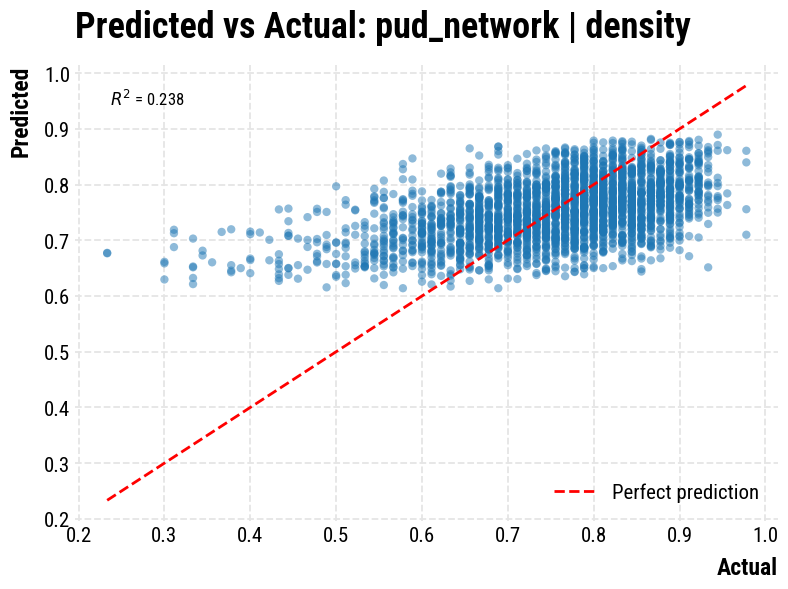

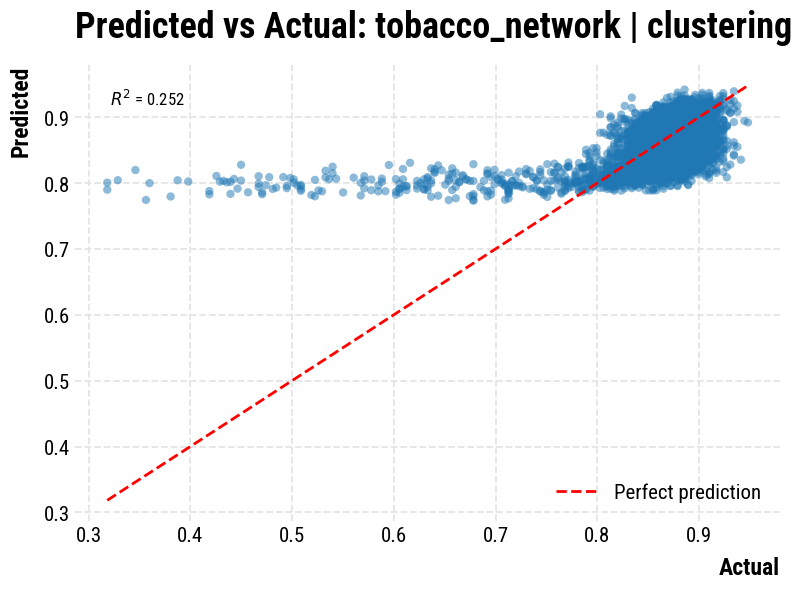

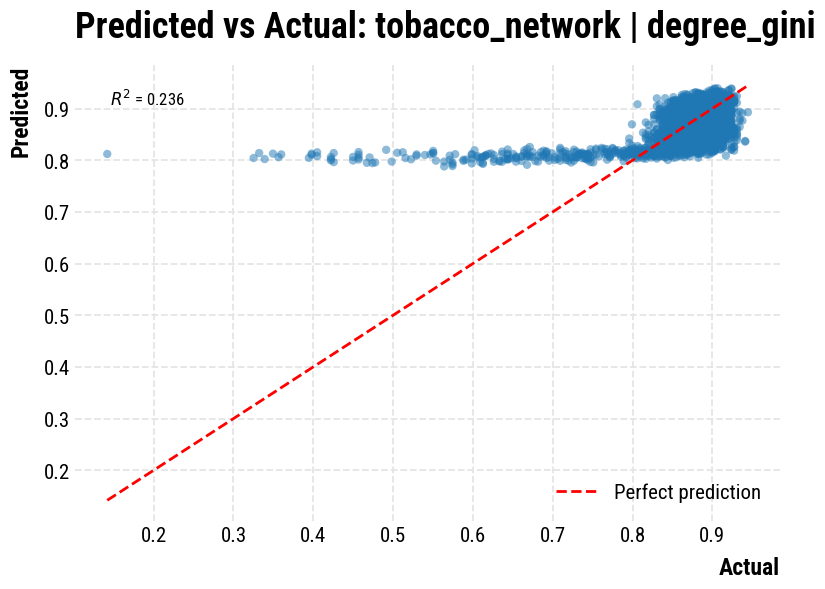

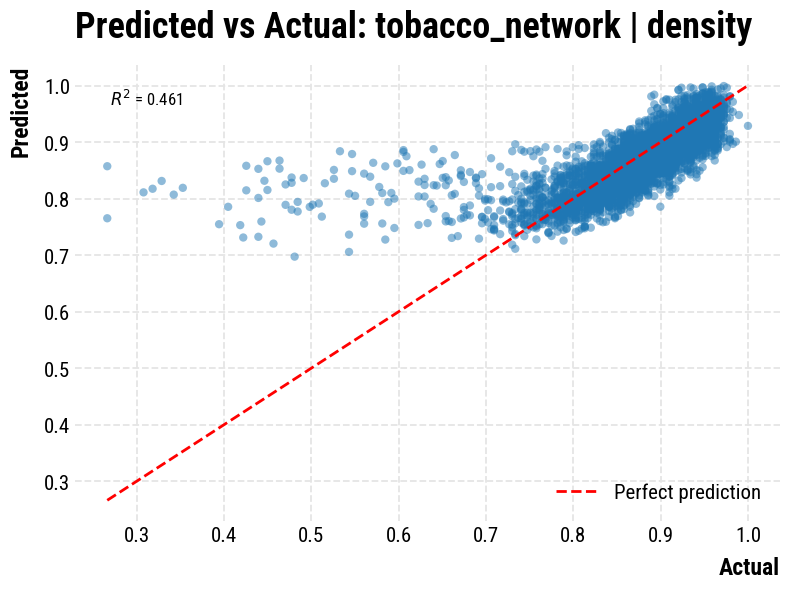

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.formula.api as smf


def standardize_columns(data, columns):
    data_std = data.copy()
    for col in columns:
        values = pd.to_numeric(data_std[col], errors="coerce")
        sd = values.std(ddof=1)
        if pd.notna(sd) and sd > 0:
            data_std[col] = (values - values.mean()) / sd
        else:
            data_std[col] = 0.0
    return data_std


def fit_models(df, predictors):
    predictors = list(predictors)
    if not predictors:
        raise ValueError("no retained predictors after near-constant screening")

    data = df.copy()
    model_columns = [target, *predictors]
    data[model_columns] = _finite_numeric_frame(data, model_columns)
    data = data.dropna(subset=model_columns).copy()

    if len(data) <= len(predictors) + 1:
        raise ValueError("not enough complete rows for OLS")

    formula = f"{target} ~ " + " + ".join(predictors)
    model = smf.ols(formula, data=data).fit()
    data_std = standardize_columns(data, predictors + [target])
    model_std = smf.ols(formula, data=data_std).fit()
    return model, model_std, data


models = {}
models_std = {}
model_data = {}

for name, df in result_datasets.items():
    try:
        model, model_std, data = fit_models(df, methods_columns[name])
    except ValueError as exc:
        print(f"Skipping OLS for {name}: {exc}")
        continue
    models[name] = model
    models_std[name] = model_std
    model_data[name] = data

for name in sorted(models):
    model = models[name]
    print(f"=== {name} (unstandardized fit) ===")
    print(model.summary())
    print()

# Coefficient dotplots
for name in sorted(models):
    model = models_std[name]
    predictors = methods_columns[name]

    coefs = model.params[predictors]
    conf_int = model.conf_int().loc[predictors]

    coef_df = pd.DataFrame({
        'predictor': predictors,
        'coefficient': coefs.values,
        'ci_lower': conf_int[0].values,
        'ci_upper': conf_int[1].values
    })

    coef_df = coef_df.sort_values('coefficient')

    fig, ax = plt.subplots(figsize=(8, max(3, len(predictors) * 0.5)))

    for i, row in enumerate(coef_df.itertuples()):
        ax.hlines(y=i, xmin=row.ci_lower, xmax=row.ci_upper, color='gray', linewidth=2)

    ax.scatter(coef_df['coefficient'], range(len(coef_df)), color='orange', s=100, zorder=5)
    ax.axvline(x=0, color='black', linestyle='--', linewidth=1)

    ax.set_yticks(range(len(coef_df)))
    ax.set_yticklabels([label_map.get(p, p) for p in coef_df['predictor']])
    ax.set_xlabel('Standardized Coefficient (95% CI)')
    ax.set_title(f'Coefficient Plot: {name}')

    plt.tight_layout()
    plt.show()

# Predicted vs Actual plots
for name in sorted(models):
    model = models[name]
    data = model_data[name]

    actual = data[target]
    predicted = model.predict(data)

    fig, ax = plt.subplots(figsize=(8, 6))

    ax.scatter(actual, predicted, alpha=0.5, edgecolors='none')

    min_val = min(actual.min(), predicted.min())
    max_val = max(actual.max(), predicted.max())
    ax.plot([min_val, max_val], [min_val, max_val], 'r--', linewidth=2, label='Perfect prediction')

    r_squared = model.rsquared
    ax.annotate(f'$R^2$ = {r_squared:.3f}', xy=(0.05, 0.95),
                xycoords='axes fraction', fontsize=12,
                verticalalignment='top')

    ax.set_xlabel('Actual')
    ax.set_ylabel('Predicted')
    ax.set_title(f'Predicted vs Actual: {name}')
    ax.legend(loc='lower right')

    plt.tight_layout()
    plt.show()


## Loaded datasets

Quick inspection of the source/target-stat datasets used below.


In [7]:
print(f"Source files: {list(source_files)}")
display(source_groups)
display(analysis_groups)
for name, data in result_datasets.items():
    print(f"\n=== {name} ===")
    display(data[["analysis_source_id", "sa_target_stat", target, *methods_columns[name], "sa_edit_distance_fraction"]].head())


Source files: ['ego_depletion_results_sa.csv', 'pud_results_sa.csv', 'tobacco_results_sa.csv']


,analysis_source_id,n_rows,n_complete_outcomes,mean_share_correct,min_share_correct,max_share_correct
0,ego_network,10000,10000,0.970504,0.003976,1.000000
1,pud_network,10000,10000,0.737732,0.166667,0.977778
2,tobacco_network,10000,10000,0.861868,0.141869,1.000000


,analysis_source_id,sa_target_stat,n_rows,n_complete_outcomes,mean_share_correct,min_share_correct,max_share_correct
0,ego_network,clustering,2667,2667,0.973519,0.015905,1.000000
1,ego_network,degree_gini,3222,3222,0.970584,0.007952,1.000000
2,ego_network,density,4111,4111,0.968486,0.003976,1.000000
3,pud_network,clustering,3960,3960,0.729071,0.177778,0.966667
4,pud_network,degree_gini,3236,3236,0.734573,0.166667,0.966667
5,pud_network,density,2804,2804,0.753610,0.233333,0.977778
6,tobacco_network,clustering,3469,3469,0.855506,0.318339,0.948097
7,tobacco_network,degree_gini,3084,3084,0.862987,0.141869,0.944637
8,tobacco_network,density,3447,3447,0.867268,0.266436,1.000000



=== ego_network | density ===


,analysis_source_id,sa_target_stat,share_of_correct_agents_at_convergence,n_experiments,uncertainty,sa_achieved_density,sa_achieved_degree_gini,sa_achieved_clustering,sa_edit_distance_fraction
0,ego_network,density,0.984095,4055,0.000691,0.005683,0.920390,0.421508,0.510740
2,ego_network,density,0.992048,8700,0.000155,0.007818,0.920417,0.421673,0.326969
3,ego_network,density,0.950298,7645,0.000207,0.004535,0.920614,0.422294,0.609615
4,ego_network,density,0.984095,9817,0.000457,0.006669,0.920513,0.421682,0.425844
5,ego_network,density,0.978131,1027,0.000571,0.005354,0.920459,0.421853,0.539039



=== ego_network | degree_gini ===


,analysis_source_id,sa_target_stat,share_of_correct_agents_at_convergence,n_experiments,uncertainty,sa_achieved_degree_gini,sa_achieved_clustering,sa_edit_distance_fraction
1,ego_network,degree_gini,0.996024,8034,0.000198,0.935071,0.421721,0.066826
7,ego_network,degree_gini,0.996024,4302,0.000762,0.891259,0.421701,0.070917
8,ego_network,degree_gini,0.998012,7273,0.000396,0.946319,0.421890,0.150699
13,ego_network,degree_gini,0.998012,3192,0.000829,0.876545,0.421696,0.097511
15,ego_network,degree_gini,0.996024,2527,0.000536,0.912225,0.421692,0.023866



=== ego_network | clustering ===


,analysis_source_id,sa_target_stat,share_of_correct_agents_at_convergence,n_experiments,uncertainty,sa_achieved_clustering,sa_edit_distance_fraction
10,ego_network,clustering,0.958250,6989,0.000071,0.401118,0.005455
14,ego_network,clustering,0.992048,6981,0.000160,0.467072,0.047051
19,ego_network,clustering,0.998012,9699,0.000171,0.461510,0.022503
23,ego_network,clustering,1.000000,3553,0.000334,0.178234,0.168428
25,ego_network,clustering,0.996024,4468,0.000257,0.486337,0.048415



=== pud_network | density ===


,analysis_source_id,sa_target_stat,share_of_correct_agents_at_convergence,n_experiments,uncertainty,sa_achieved_density,sa_achieved_degree_gini,sa_achieved_clustering,sa_edit_distance_fraction
10002,pud_network,density,0.944444,5108,0.000930,0.032210,0.724548,0.370277,0.61250
10005,pud_network,density,0.466667,3063,0.000027,0.033333,0.724553,0.370283,0.66875
10007,pud_network,density,0.866667,9225,0.000942,0.031960,0.724566,0.370270,0.60000
10008,pud_network,density,0.777778,2320,0.000551,0.031586,0.725033,0.369110,0.58125
10009,pud_network,density,0.744444,4914,0.000380,0.015106,0.726814,0.370166,0.24375



=== pud_network | degree_gini ===


,analysis_source_id,sa_target_stat,share_of_correct_agents_at_convergence,n_experiments,uncertainty,sa_achieved_degree_gini,sa_achieved_clustering,sa_edit_distance_fraction
10004,pud_network,degree_gini,0.822222,4252,0.000765,0.600556,0.370242,0.2375
10015,pud_network,degree_gini,0.333333,3707,0.000021,0.858889,0.370253,0.5125
10017,pud_network,degree_gini,0.877778,6594,0.000929,0.571250,0.366102,0.2750
10019,pud_network,degree_gini,0.800000,7550,0.000114,0.473611,0.368771,0.4500
10024,pud_network,degree_gini,0.833333,3886,0.000990,0.486667,0.370229,0.4625



=== pud_network | clustering ===


,analysis_source_id,sa_target_stat,share_of_correct_agents_at_convergence,n_experiments,uncertainty,sa_achieved_clustering,sa_edit_distance_fraction
10000,pud_network,clustering,0.711111,1084,0.000919,0.358065,0.0125
10001,pud_network,clustering,0.477778,1432,0.000125,0.585551,0.2125
10003,pud_network,clustering,0.477778,6277,0.000264,0.457045,0.0625
10006,pud_network,clustering,0.766667,9964,0.000277,0.411765,0.0625
10012,pud_network,clustering,0.733333,2903,0.000313,0.147766,0.1250



=== tobacco_network | density ===


,analysis_source_id,sa_target_stat,share_of_correct_agents_at_convergence,n_experiments,uncertainty,sa_achieved_density,sa_achieved_degree_gini,sa_achieved_clustering,sa_edit_distance_fraction
20003,tobacco_network,density,0.788927,4345,0.000456,0.005971,0.760146,0.298632,0.595606
20004,tobacco_network,density,0.861592,1990,0.000614,0.007425,0.760955,0.299083,0.497152
20008,tobacco_network,density,0.948097,4969,0.000668,0.022311,0.761365,0.299193,0.510985
20010,tobacco_network,density,0.826990,9586,0.000043,0.016881,0.761349,0.299190,0.143206
20011,tobacco_network,density,0.840830,8574,0.000711,0.009732,0.761297,0.299392,0.340928



=== tobacco_network | degree_gini ===


,analysis_source_id,sa_target_stat,share_of_correct_agents_at_convergence,n_experiments,uncertainty,sa_achieved_degree_gini,sa_achieved_clustering,sa_edit_distance_fraction
20002,tobacco_network,degree_gini,0.885813,1139,0.000704,0.538289,0.297058,0.318959
20006,tobacco_network,degree_gini,0.882353,8148,0.000553,0.791067,0.299337,0.055330
20007,tobacco_network,degree_gini,0.844291,1401,0.000908,0.533007,0.295038,0.328723
20009,tobacco_network,degree_gini,0.913495,4755,0.000371,0.576714,0.297756,0.260374
20017,tobacco_network,degree_gini,0.899654,8424,0.000988,0.529167,0.295298,0.331977



=== tobacco_network | clustering ===


,analysis_source_id,sa_target_stat,share_of_correct_agents_at_convergence,n_experiments,uncertainty,sa_achieved_clustering,sa_edit_distance_fraction
20000,tobacco_network,clustering,0.903114,8922,0.000776,0.372292,0.084622
20001,tobacco_network,clustering,0.882353,3904,0.000384,0.094677,0.250610
20005,tobacco_network,clustering,0.851211,9575,0.000052,0.194460,0.076485
20012,tobacco_network,clustering,0.871972,3287,0.000756,0.435743,0.211554
20016,tobacco_network,clustering,0.882353,6641,0.000185,0.340511,0.061839


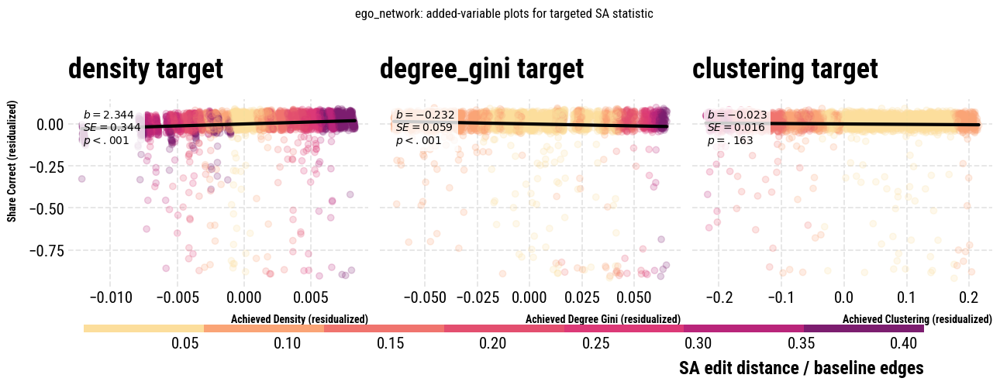

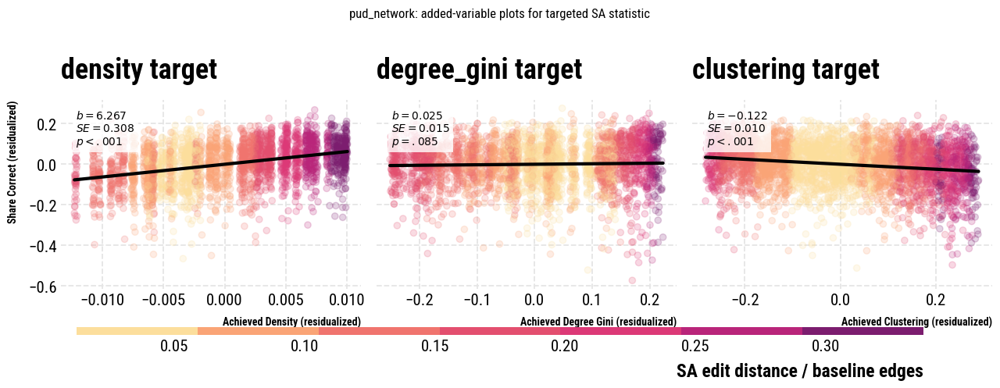

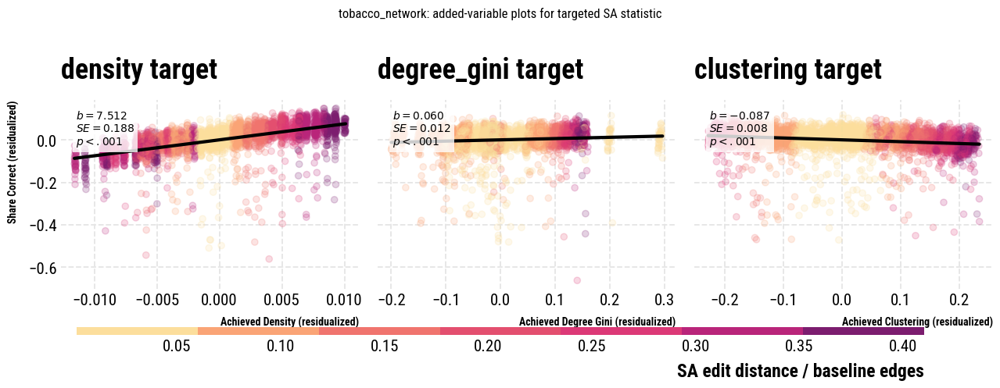

In [8]:
import matplotlib.pyplot as plt
import numpy as np
from statsmodels.graphics.regressionplots import plot_partregress


def target_model_names_for_source(source_id):
    names = []
    for target_stat in target_stat_order:
        name = f"{source_id} | {target_stat}"
        if name in models:
            names.append(name)
    names.extend(
        name for name, meta in dataset_meta.items()
        if meta["source_id"] == source_id and name in models and name not in names
    )
    return names


# Added variable plots: one facet per SA target stat, showing only the predictor that was deliberately varied.
for source_id in sorted({meta["source_id"] for meta in dataset_meta.values()}):
    facet_data = []
    for name in target_model_names_for_source(source_id):
        target_stat = dataset_meta[name]["sa_target_stat"]
        predictor = target_predictor_map.get(target_stat)
        predictors = methods_columns[name]
        if predictor not in predictors:
            print(f"Skipping added-variable facet for {name}: {predictor} is not available")
            continue
        if model_data[name][predictor].nunique(dropna=True) < 2:
            print(f"Skipping added-variable facet for {name}: {predictor} does not vary in this subset")
            continue

        model = models[name]
        data = model_data[name]
        focus_idx = predictors.index(predictor) + 1
        other_idx = [0] + [j + 1 for j, p in enumerate(predictors) if p != predictor]

        from statsmodels.regression.linear_model import OLS

        y = model.model.endog
        X_others = model.model.exog[:, other_idx]
        resid_y = OLS(y, X_others).fit().resid

        x_focus = model.model.exog[:, focus_idx]
        resid_x = OLS(x_focus, X_others).fit().resid

        facet_data.append({
            "name": name,
            "target_stat": target_stat,
            "predictor": predictor,
            "x": resid_x,
            "y": resid_y,
            "color": data["sa_edit_distance_fraction"].to_numpy() if "sa_edit_distance_fraction" in data.columns else None,
            "coef": model.params[predictor],
            "se": model.bse[predictor],
            "pval": model.pvalues[predictor],
        })

    if not facet_data:
        continue

    fig, axes = plt.subplots(1, len(facet_data), figsize=(4.3 * len(facet_data), 4.2), sharey=True, squeeze=False)
    axes = axes.ravel()
    scatter = None
    y_all = np.concatenate([item["y"] for item in facet_data])
    y_pad = (y_all.max() - y_all.min()) * 0.05 if y_all.max() > y_all.min() else 1
    y_lim = (y_all.min() - y_pad, y_all.max() + y_pad)

    for ax, item in zip(axes, facet_data):
        if item["color"] is not None:
            scatter = ax.scatter(item["x"], item["y"], c=item["color"], cmap=colormaps.sunsetdark, alpha=0.2)
        else:
            ax.scatter(item["x"], item["y"], alpha=0.7)

        slope, intercept = np.polyfit(item["x"], item["y"], 1)
        x_line = np.linspace(item["x"].min(), item["x"].max(), 100)
        ax.plot(x_line, slope * x_line + intercept, 'k-', linewidth=3)

        coef_text = f'$b={item["coef"]:.3f}$\n$SE={item["se"]:.3f}$\n$p{format_p(item["pval"])}$'
        ax.annotate(coef_text, xy=(0.05, 0.95), xycoords='axes fraction',
                    fontsize=10, verticalalignment='top',
                    bbox=dict(boxstyle='square', facecolor='white', alpha=0.8, edgecolor='none'))

        ax.set_title(f'{item["target_stat"]} target')
        ax.set_xlabel(f'{label_map.get(item["predictor"], item["predictor"])} (residualized)', fontsize=10)
        ax.set_ylim(y_lim)

    axes[0].set_ylabel('Share Correct (residualized)', fontsize=10)
    fig.suptitle(f'{source_id}: added-variable plots for targeted SA statistic', y=1.04)
    plt.tight_layout()

    if scatter is not None:
        fig.subplots_adjust(bottom=0.18)
        cbar_ax = fig.add_axes([0.08, 0.04, 0.84, 0.025])
        cbar = fig.colorbar(scatter, cax=cbar_ax, orientation='horizontal', label='SA edit distance / baseline edges')
        cbar.solids.set_alpha(1)

    plt.show()


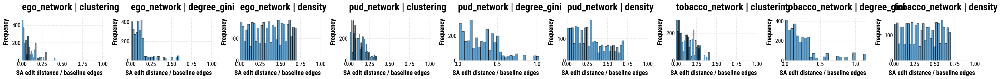

In [9]:
import matplotlib.pyplot as plt
import numpy as np

# Create histograms for SA edit distance across source/target-stat datasets
fig, axes = plt.subplots(1, len(result_datasets), figsize=(4 * len(result_datasets), 3))
if len(result_datasets) == 1:
    axes = [axes]

for ax, (name, data) in zip(axes, sorted(result_datasets.items())):
    if 'sa_edit_distance_fraction' in data.columns:
        edit_distance_fraction = data['sa_edit_distance_fraction'].dropna()
        ax.hist(edit_distance_fraction, bins=30, edgecolor='black', alpha=0.7)
        ax.set_xlabel('SA edit distance / baseline edges')
        ax.set_ylabel('Frequency')
        ax.set_title(f'{name}')
        ax.set_xlim(0, max(1, edit_distance_fraction.max() if len(edit_distance_fraction) else 1))

plt.tight_layout()
plt.show()


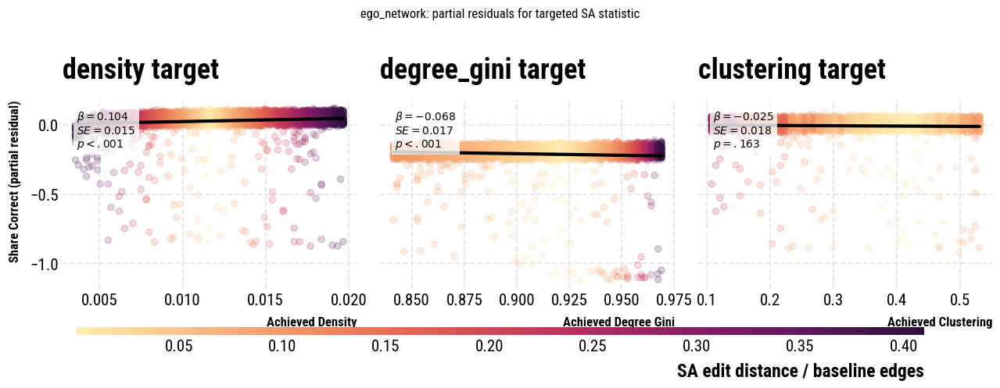

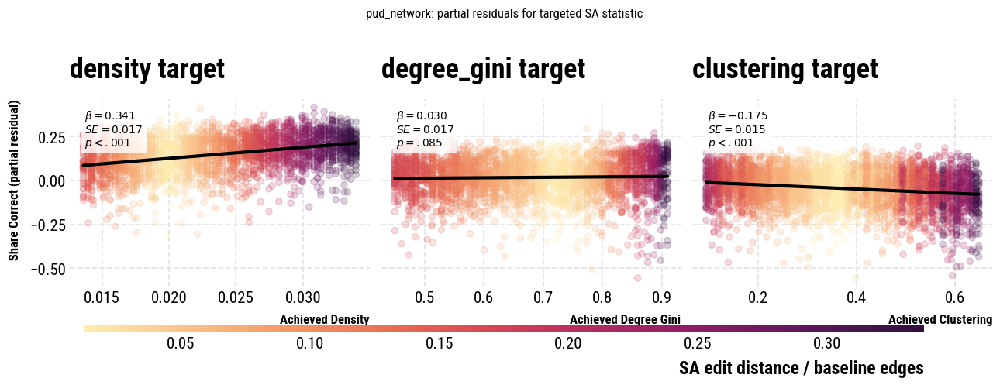

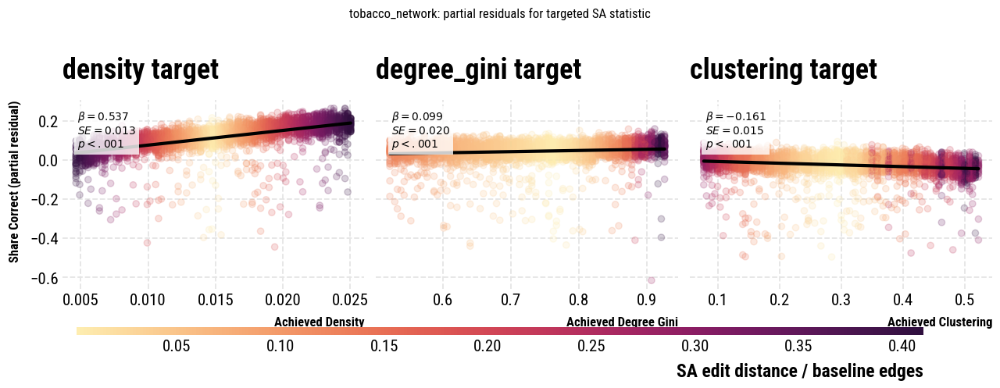

In [10]:
import matplotlib.pyplot as plt
import numpy as np

# Partial residual plots: one facet per SA target stat, showing only the predictor that was deliberately varied.
for source_id in sorted({meta["source_id"] for meta in dataset_meta.values()}):
    facet_data = []
    for name in target_model_names_for_source(source_id):
        target_stat = dataset_meta[name]["sa_target_stat"]
        predictor = target_predictor_map.get(target_stat)
        predictors = methods_columns[name]
        if predictor not in predictors:
            print(f"Skipping partial-residual facet for {name}: {predictor} is not available")
            continue
        if model_data[name][predictor].nunique(dropna=True) < 2:
            print(f"Skipping partial-residual facet for {name}: {predictor} does not vary in this subset")
            continue

        model = models[name]
        data = model_data[name]
        x = data[predictor].to_numpy()
        pr_y = model.resid.to_numpy() + model.params[predictor] * x
        model_std = models_std.get(name) if "models_std" in globals() else None
        if model_std is not None:
            coef = model_std.params[predictor]
            se = model_std.bse[predictor]
            pval = model_std.pvalues[predictor]
            coef_label = "\\beta"
        else:
            coef = model.params[predictor]
            se = model.bse[predictor]
            pval = model.pvalues[predictor]
            coef_label = "b"

        facet_data.append({
            "name": name,
            "target_stat": target_stat,
            "predictor": predictor,
            "x": x,
            "y": pr_y,
            "color": data["sa_edit_distance_fraction"].to_numpy() if "sa_edit_distance_fraction" in data.columns else None,
            "coef": coef,
            "se": se,
            "pval": pval,
            "coef_label": coef_label,
        })

    if not facet_data:
        continue

    fig, axes = plt.subplots(1, len(facet_data), figsize=(4.3 * len(facet_data), 4.2), sharey=True, squeeze=False)
    axes = axes.ravel()
    scatter = None
    y_all = np.concatenate([item["y"] for item in facet_data])
    y_pad = (y_all.max() - y_all.min()) * 0.05 if y_all.max() > y_all.min() else 1
    y_lim = (y_all.min() - y_pad, y_all.max() + y_pad)

    for ax, item in zip(axes, facet_data):
        if item["color"] is not None:
            scatter = ax.scatter(item["x"], item["y"], c=item["color"], cmap=colormaps.matter, alpha=0.2)
        else:
            ax.scatter(item["x"], item["y"], alpha=0.7)

        slope, intercept = np.polyfit(item["x"], item["y"], 1)
        x_line = np.linspace(item["x"].min(), item["x"].max(), 100)
        ax.plot(x_line, slope * x_line + intercept, 'k-', linewidth=3)

        coef_text = f'${item["coef_label"]}={item["coef"]:.3f}$\n$SE={item["se"]:.3f}$\n$p{format_p(item["pval"])}$'
        ax.annotate(coef_text, xy=(0.05, 0.95), xycoords='axes fraction',
                    fontsize=10, verticalalignment='top',
                    bbox=dict(boxstyle='square', facecolor='white', alpha=0.8, edgecolor='none'))

        ax.set_title(f'{item["target_stat"]} target')
        ax.set_xlabel(label_map.get(item["predictor"], item["predictor"]), fontsize=12)
        ax.set_ylim(y_lim)

    axes[0].set_ylabel('Share Correct (partial residual)', fontsize=12)
    fig.suptitle(f'{source_id}: partial residuals for targeted SA statistic', y=1.04)
    plt.tight_layout()

    if scatter is not None:
        fig.subplots_adjust(bottom=0.18)
        cbar_ax = fig.add_axes([0.08, 0.04, 0.84, 0.025])
        cbar = fig.colorbar(scatter, cax=cbar_ax, orientation='horizontal', label='SA edit distance / baseline edges')
        cbar.solids.set_alpha(1)

    plt.savefig(figures_dir / f"partial_residual_targeted_stats_{safe_filename(source_id)}.pdf", dpi=300)
    plt.show()
